In [57]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Input, Dropout
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from keras.models import Model
import seaborn as sns
import os
from statsmodels.tsa.seasonal import seasonal_decompose
from keras.preprocessing.sequence import TimeseriesGenerator

Below is taken from data_visualization.ipynb

In [58]:
datalist = []

# Searching for training data within the dataset folder
for file in os.listdir("../dataset/train/"):
    if file.endswith(".csv"):
        datalist.append(os.path.join("../dataset/train/", file))

# Sort the training data and labels
datalist = sorted(datalist)
labeldir = "../dataset/labels.csv"

# Print the sorted filepath to the training data
print(datalist)

['../dataset/train/1.csv', '../dataset/train/10.csv', '../dataset/train/100.csv', '../dataset/train/101.csv', '../dataset/train/102.csv', '../dataset/train/103.csv', '../dataset/train/104.csv', '../dataset/train/105.csv', '../dataset/train/106.csv', '../dataset/train/107.csv', '../dataset/train/108.csv', '../dataset/train/109.csv', '../dataset/train/11.csv', '../dataset/train/110.csv', '../dataset/train/111.csv', '../dataset/train/112.csv', '../dataset/train/113.csv', '../dataset/train/114.csv', '../dataset/train/115.csv', '../dataset/train/116.csv', '../dataset/train/117.csv', '../dataset/train/118.csv', '../dataset/train/119.csv', '../dataset/train/12.csv', '../dataset/train/120.csv', '../dataset/train/121.csv', '../dataset/train/122.csv', '../dataset/train/123.csv', '../dataset/train/124.csv', '../dataset/train/125.csv', '../dataset/train/126.csv', '../dataset/train/127.csv', '../dataset/train/128.csv', '../dataset/train/129.csv', '../dataset/train/13.csv', '../dataset/train/130.csv

Below is just for quickly viewing single satellite data. Piece of code is taken from data_visualization.ipynb. Data is read as a pandas dataframe. 

In [59]:
# Load the first training data. Note: Python starts counting from 0, instead of 1.
idx_data = 167

data_path = datalist[idx_data]
data = pd.read_csv(data_path) #dataframe

# Print the loaded data
data

,Eccentricity,Semimajor Axis (m),Inclination (deg),RAAN (deg),Argument of Periapsis (deg),True Anomaly (deg),Latitude (deg),Longitude (deg),Altitude (m),X (m),Y (m),Z (m),Vx (m/s),Vy (m/s),Vz (m/s)
0,0.000525,4.216570e+07,0.131971,115.230153,51.760925,165.874393,0.029856,-6.986470,3.580903e+07,3.754390e+07,-1.924081e+07,-59335.684030,1401.900610,2734.632869,-5.605880
1,0.000506,4.216648e+07,0.131915,115.195710,50.943698,196.775565,0.002758,-7.019115,3.580879e+07,4.213224e+07,2.145326e+06,-89877.216152,-156.730058,3069.085091,-2.681617
2,0.000509,4.216644e+07,0.131896,115.120745,50.790854,227.057496,-0.025015,-7.047138,3.580291e+07,3.538829e+07,2.295431e+07,-96192.119766,-1673.523524,2577.944164,0.968753
3,0.000524,4.216571e+07,0.131984,115.031848,52.147091,255.855640,-0.045962,-7.063790,3.579297e+07,1.912252e+07,3.758624e+07,-76547.355771,-2740.687683,1392.617425,4.362987
4,0.000543,4.216491e+07,0.132166,114.972180,54.270475,283.872855,-0.054424,-7.064982,3.578127e+07,-2.291365e+06,4.209708e+07,-36204.861014,-3070.394001,-168.740214,6.584770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2167,0.000436,4.216526e+07,0.155621,108.823050,80.882959,171.137844,-0.020130,-6.993245,3.580531e+07,4.217873e+07,6.212078e+05,-108979.273302,-45.058465,3072.963270,-2.577124
2168,0.000439,4.216529e+07,0.155629,108.782322,78.123266,203.993542,-0.041487,-7.020105,3.580405e+07,3.619524e+07,2.166169e+07,-112023.965457,-1578.739545,2636.908873,1.753753
2169,0.000443,4.216569e+07,0.155828,108.649691,75.597589,236.712696,-0.051551,-7.041384,3.579781e+07,2.047296e+07,3.687358e+07,-84826.307629,-2687.959947,1491.119181,5.629772
2170,0.000453,4.216604e+07,0.156348,108.529748,74.198686,268.303941,-0.047471,-7.051108,3.578846e+07,-7.597762e+05,4.215974e+07,-34595.273856,-3074.016368,-56.783514,8.002745


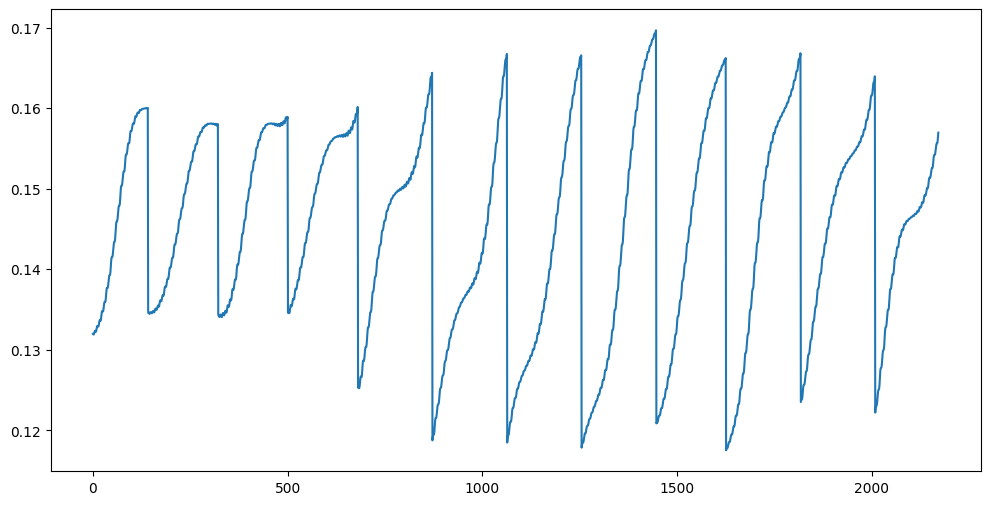

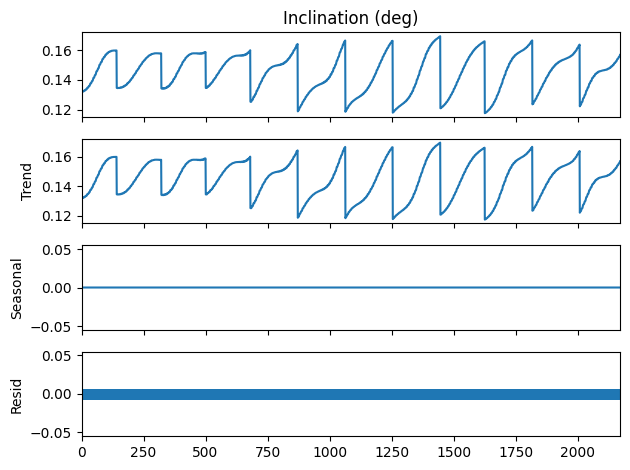

In [60]:
#data.info()

data[:]['Inclination (deg)'].plot(figsize=(12,6))
#data['Inclination (deg)']
results  = seasonal_decompose(data['Inclination (deg)'], period=1)
results.plot();

Split the data - Training and testing data

In [61]:
split_idx = 1250
#print (data[:split_idx]['Inclination (deg)'].shape) #dataframe is of shape for e.g. (1250,).
train = data[:split_idx]['Inclination (deg)'].values.reshape(-1,1) # With reshape, it is converted to (1250,1)
test = data[split_idx:]['Inclination (deg)'].values.reshape(-1,1) # With reshape, it is converted to (1250,1)
#print (np.shape(train))


Normalize the data

In [62]:
scaler = MinMaxScaler()
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)


In [63]:
print (np.shape(scaled_test))
#print(scaled_test[900:])
#print(scaled_test[-20:])


(922, 1)


In [64]:
n_input = 20
n_features = 1
generator_train = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)
generator_test = TimeseriesGenerator(scaled_test, scaled_test, length=n_input, batch_size=1)

# Initialize lists to accumulate batches. generator_train[0] only contains (1, n_input, 1). Use for loop to accumulate.
all_X_batches = []
all_y_batches = []
all_X_batches_test = []
all_y_batches_test = []

for i in range(len(generator_train)):   
    X_batch, y_batch = generator_train[i]
    all_X_batches.append(X_batch)
    all_y_batches.append(y_batch)

for j in range(len(generator_test)):   
    X_batch_test, y_batch_test = generator_test[j]
    all_X_batches_test.append(X_batch_test)
    all_y_batches_test.append(y_batch_test)

# Convert lists to numpy arrays
gen_x = np.concatenate(all_X_batches, axis=0)
gen_y = np.concatenate(all_y_batches, axis=0)
gen_x_test = np.concatenate(all_X_batches_test, axis=0)
gen_y_test = np.concatenate(all_y_batches_test, axis=0)

print (np.shape(gen_x))
print (np.shape(gen_y))
print (np.shape(gen_x_test))
print (np.shape(gen_y_test))

(1230, 20, 1)
(1230, 1)
(902, 20, 1)
(902, 1)


In [65]:
model = Sequential()
model.add(LSTM(128, activation='relu', input_shape=(n_input, n_features)))
model.add(Dropout(rate=0.3))
model.add(RepeatVector(n_input))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(Dropout(rate=0.3))
model.add(TimeDistributed(Dense(n_features)))

model.compile(optimizer='adam',loss='mae')

In [66]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 128)               66560     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 repeat_vector_3 (RepeatVec  (None, 20, 128)           0         
 tor)                                                            
                                                                 
 lstm_7 (LSTM)               (None, 20, 128)           131584    
                                                                 
 dropout_7 (Dropout)         (None, 20, 128)           0         
                                                                 
 time_distributed_3 (TimeDi  (None, 20, 1)             129       
 stributed)                                           

In [67]:
history = model.fit(gen_x, gen_y, epochs=70)

Epoch 1/70
39/39 [==============================] - 3s 16ms/step - loss: 0.2238
Epoch 2/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0830
Epoch 3/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0617
Epoch 4/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0497
Epoch 5/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0422
Epoch 6/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0411
Epoch 7/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0378
Epoch 8/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0358
Epoch 9/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0355
Epoch 10/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0345
Epoch 11/70
39/39 [==============================] - 1s 17ms/step - loss: 0.0340
Epoch 12/70
39/39 [==============================] - 1s 16ms/step - loss: 0.0338
Epoch 13/70
39/39 [==================

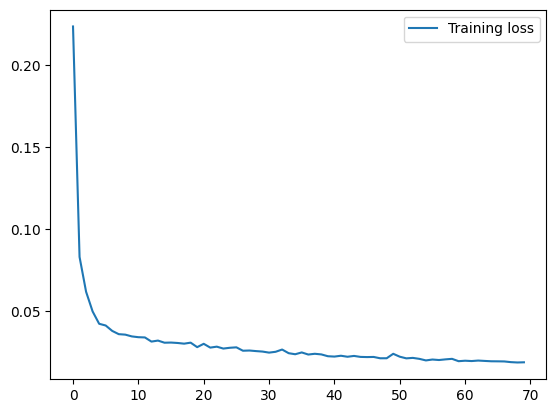

In [68]:
plt.plot(history.history['loss'], label='Training loss')
#plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

In [69]:
print (range(5))

range(0, 5)


In [70]:
#loss_per_epoch = model.history.history['loss']
#plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [71]:
trainPredict = model.predict(gen_x)


39/39 [==============================] - 0s 7ms/step


In [72]:
print (trainPredict.shape)
print (testPredict.shape)

(1230, 20, 1)
(902, 20, 1)


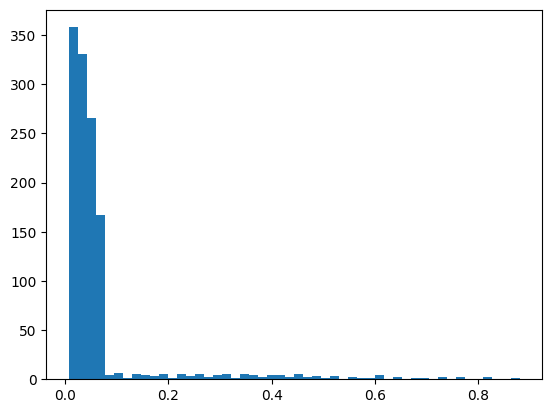

In [73]:
trainMAE = np.mean(np.abs(trainPredict - gen_x), axis=1)
plt.hist(trainMAE, bins=50)
max_trainMAE = 0.3

29/29 [==============================] - 0s 7ms/step
(902, 20, 1)


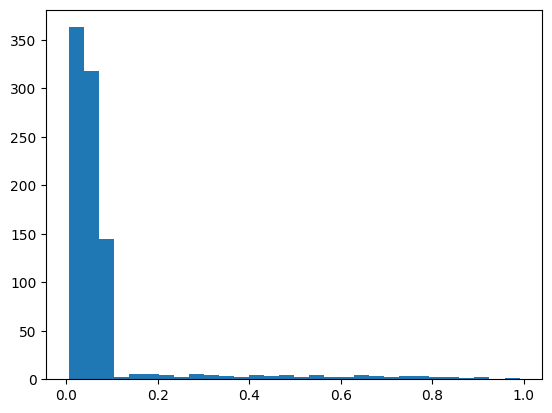

In [74]:
testPredict = model.predict(gen_x_test)
testMAE = np.mean(np.abs(testPredict - gen_x_test), axis=1)
plt.hist(testMAE, bins=30)

print (testPredict.shape)

In [75]:
#Convert the shape (902,20,1) to (922,1)
recon_train = np.empty([split_idx,1])

train_rows = np.shape(scaled_test)[0]
recon_test = np.empty([train_rows,1]) 
recon_train[:split_idx-n_input,0] = trainPredict[:,0,0]
recon_train[split_idx-n_input:,0] = np.transpose(trainPredict[-1,:,0])

recon_test[:train_rows-n_input,0] = testPredict[:,0,0]
recon_test[train_rows-n_input:,0] = np.transpose(testPredict[-1,:,0])




print (np.transpose(trainPredict[-1,:,0]))
print (trainPredict[-1,1:,0])


test_array = np.zeros([3,5])
test_array[-1,1:] = 5
print (test_array)
print(split_idx-n_input-1)

[0.9567729  0.9301207  0.9289     0.93036294 0.92964697 0.92889225
 0.92843914 0.92825043 0.9282321  0.9283025  0.9284072  0.9285139
 0.92860556 0.92867446 0.9287188  0.9287398  0.9287405  0.9287244
 0.92869556 0.9286572 ]
[0.9301207  0.9289     0.93036294 0.92964697 0.92889225 0.92843914
 0.92825043 0.9282321  0.9283025  0.9284072  0.9285139  0.92860556
 0.92867446 0.9287188  0.9287398  0.9287405  0.9287244  0.92869556
 0.9286572 ]
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 5. 5. 5. 5.]]
1229


In [76]:
# Inverse transform the scaled predictions to the original scale
#trainPredict_original = scaler.inverse_transform(trainPredict.reshape(-1, 1))
#testPredict_original = scaler.inverse_transform(testPredict.reshape(-1, 1))

trainPredict_original = scaler.inverse_transform(recon_train)
testPredict_original = scaler.inverse_transform(recon_test)

# Inverse transform the original data for comparison
scaled_train_original = scaler.inverse_transform(scaled_train)
scaled_test_original = scaler.inverse_transform(scaled_test)

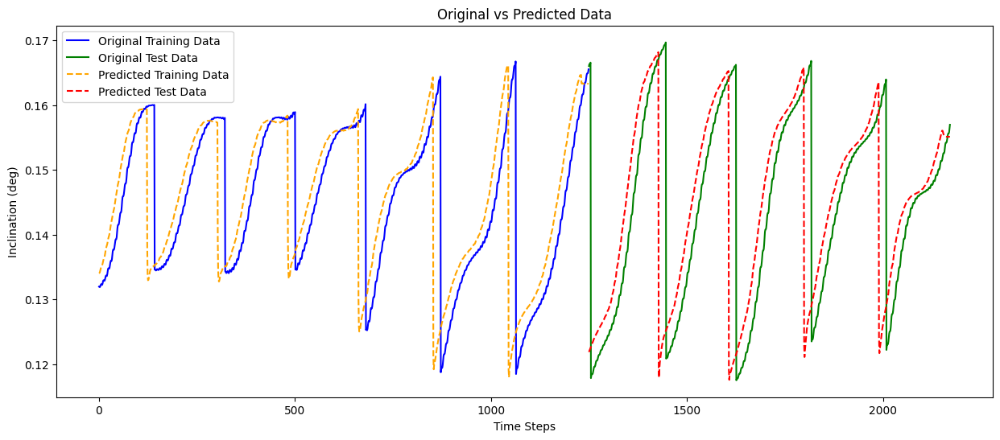

In [77]:
# Plot the results
plt.figure(figsize=(15, 6))

# Plot original training data
plt.plot(scaled_train_original, label='Original Training Data', color='blue')

# Plot original test data
plt.plot(np.arange(split_idx, len(data['Inclination (deg)'])),
         scaled_test_original, label='Original Test Data', color='green')

# Plot rescaled predictions on training data
plt.plot(np.arange(0,1250),trainPredict_original, label='Predicted Training Data', linestyle='dashed', color='orange')

# Plot rescaled predictions on test data
plt.plot(np.arange(1250,2172),testPredict_original, label='Predicted Test Data', linestyle='dashed', color='red')

# Plot rescaled predictions on training data
#plt.plot(np.arange(n_input, n_input + len(trainPredict_original)),
#         trainPredict_original, label='Predicted Training Data', linestyle='dashed', color='orange')

# Plot rescaled predictions on test data
#plt.plot(np.arange(split_idx + n_input, split_idx + n_input + len(testPredict_original)),
#         testPredict_original, label='Predicted Test Data', linestyle='dashed', color='red')

plt.title('Original vs Predicted Data')
plt.xlabel('Time Steps')
plt.ylabel('Inclination (deg)')
plt.legend()
plt.show()

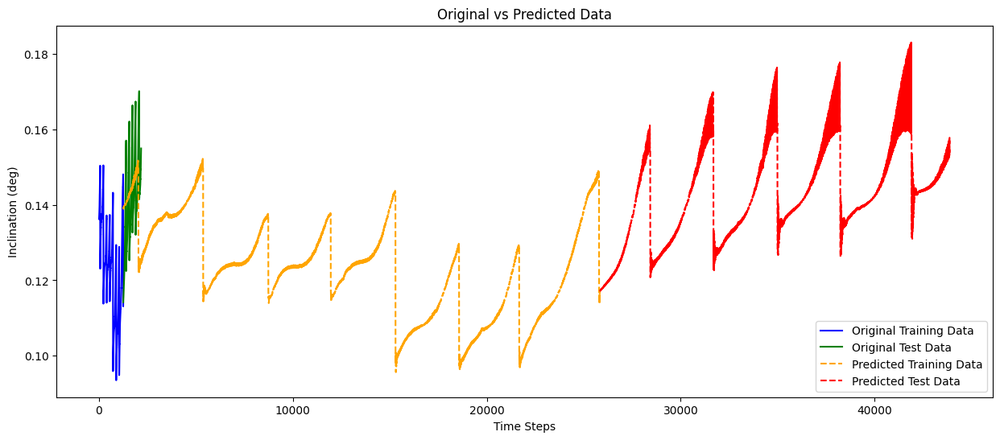

In [59]:
# Assuming scaled_train_original and scaled_test_original are of shape (1250, 1) and (922, 1) respectively
# Assuming trainPredict_original and testPredict_original are of shape (24600, 1) and (18040, 1) respectively

# Plot the results
plt.figure(figsize=(15, 6))

# Plot original training data
plt.plot(np.arange(len(scaled_train_original)), scaled_train_original, label='Original Training Data', color='blue')

# Plot original test data
plt.plot(np.arange(len(scaled_train_original), len(scaled_train_original) + len(scaled_test_original)),
         scaled_test_original, label='Original Test Data', color='green')

# Plot rescaled predictions on training data
plt.plot(np.arange(len(scaled_train_original), len(scaled_train_original) + len(trainPredict_original)),
         trainPredict_original, label='Predicted Training Data', linestyle='dashed', color='orange')

# Plot rescaled predictions on test data
plt.plot(np.arange(len(scaled_train_original) + len(trainPredict_original),
                  len(scaled_train_original) + len(trainPredict_original) + len(testPredict_original)),
         testPredict_original, label='Predicted Test Data', linestyle='dashed', color='red')

plt.title('Original vs Predicted Data')
plt.xlabel('Time Steps')
plt.ylabel('Inclination (deg)')
plt.legend()
plt.show()


In [20]:
#Capture all details in a DataFrame for easy plotting
anomaly_df = pd.DataFrame(scaled_test[n_input:])
anomaly_df['testMAE'] = testMAE
anomaly_df['max_trainMAE'] = max_trainMAE
anomaly_df['anomaly'] = anomaly_df['testMAE'] > anomaly_df['max_trainMAE']
anomaly_df['Close'] = scaled_test[n_input:]

r, c = anomaly_df.shape

print (r)
print (c)


902
5


<Axes: ylabel='testMAE'>

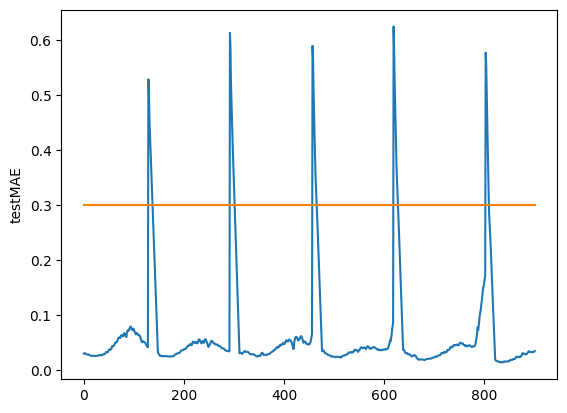

In [21]:
#Plot testMAE vs max_trainMAE
sns.lineplot(x=range(902), y=anomaly_df['testMAE'])
sns.lineplot(x=range(902), y=anomaly_df['max_trainMAE'])

In [22]:
anomalies = anomaly_df.loc[anomaly_df['anomaly'] == True]

#Plot anomalies
sns.lineplot(x=range(1250), y=scaler.inverse_transform(anomaly_df['Close']))
#sns.scatterplot(x=range(902), y=scaler.inverse_transform(anomalies['Close']), color='r')

ValueError: Expected 2D array, got 1D array instead:
array=[0.41774058 0.41941594 0.41946893 0.41960937 0.42373129 0.42553391
 0.42962651 0.43130932 0.43432561 0.43439963 0.43613485 0.43831083
 0.44230767 0.44420843 0.44641081 0.4482263  0.44888248 0.45217806
 0.45622107 0.45749048 0.4598421  0.46043397 0.46222961 0.46534273
 0.47056301 0.4735501  0.47461283 0.47503849 0.47794646 0.4820139
 0.48666513 0.49023864 0.49071307 0.49104367 0.49303151 0.4985239
 0.5042942  0.50909971 0.50970813 0.50997396 0.51331047 0.52168226
 0.52551109 0.53277714 0.53333244 0.53353361 0.53593345 0.54244353
 0.55380115 0.55858398 0.55915196 0.55959266 0.56275857 0.57240969
 0.57629202 0.59261945 0.59242134 0.59269916 0.59669723 0.60479109
 0.61541132 0.62409085 0.62758968 0.62815938 0.63293367 0.64650932
 0.65022056 0.66615653 0.67321854 0.67367696 0.67746901 0.68601615
 0.68936679 0.71276958 0.71262129 0.71584758 0.72147144 0.72650762
 0.73033987 0.75906897 0.75885055 0.75927336 0.76163551 0.76570781
 0.76972926 0.81292581 0.81275385 0.81658008 0.82034054 0.83701538
 0.8404933  0.85997186 0.87352124 0.87396115 0.87720313 0.88656839
 0.88981086 0.91120262 0.92039112 0.92110091 0.92365054 0.9348758
 0.94544121 0.94639899 0.9743861  0.97438791 0.97652942 0.98639342
 0.99841154 1.00923618 1.01666967 1.01661227 1.01755215 1.02255291
 1.02944812 1.03037423 1.0612473  1.06094844 1.06154503 1.06654566
 1.07578206 1.08642421 1.09254393 1.09522321 1.09509424 1.0982803
 1.10161982 1.11546455 0.50946956 0.50879278 0.50819027 0.51151602
 0.51463816 0.5297913  0.5295572  0.53302552 0.5336502  0.53359432
 0.53677327 0.54521525 0.54495879 0.55456773 0.55695748 0.56076901
 0.56424317 0.56567305 0.56545947 0.56660157 0.57154849 0.56975926
 0.57290277 0.57745485 0.57717559 0.58264412 0.5849341  0.58476253
 0.5877927  0.59331464 0.59301448 0.59668946 0.60065684 0.59973385
 0.60288332 0.60485195 0.60691017 0.60751958 0.60978583 0.61142703
 0.61440773 0.61781009 0.6190052  0.62053958 0.62127264 0.62534012
 0.62837353 0.62992135 0.62962334 0.63301904 0.63525197 0.63960688
 0.64502488 0.64786715 0.64754488 0.64895832 0.65185977 0.65662806
 0.66005058 0.66411054 0.66382262 0.66546656 0.66862005 0.67565838
 0.68211775 0.68547563 0.68678144 0.68801763 0.692349   0.69632883
 0.69925061 0.70732432 0.70819479 0.7090304  0.71301249 0.72286031
 0.72572974 0.7367454  0.736444   0.73940201 0.74363865 0.75220737
 0.7588772  0.76429703 0.76532948 0.76625917 0.76891479 0.779511
 0.7960123  0.8008066  0.80127292 0.80272711 0.80711821 0.8153614
 0.81802702 0.83158941 0.83135277 0.83398194 0.83846561 0.85070722
 0.86701303 0.87245284 0.87329157 0.87478116 0.87928488 0.88412501
 0.88689316 0.90626962 0.90802541 0.90891971 0.913065   0.92229476
 0.94319383 0.94965722 0.95141768 0.95263453 0.95691807 0.96170176
 0.96436915 0.96469716 0.96446831 0.98779129 0.99128066 0.99492993
 1.02116421 1.02832788 1.03040496 1.03153782 1.03519196 1.04317717
 1.04556624 1.06327075 1.06306595 1.06614216 1.06827875 1.07561115
 1.08637812 1.10367117 1.10592126 1.10666474 1.10958671 1.11774331
 1.12750263 1.13627875 1.1381902  1.13824016 1.14108412 1.14720676
 1.15825674 1.16502365 1.17439312 1.17483718 1.17688973 1.18329564
 1.19177364 1.19188222 1.19166636 1.19288881 1.19617272 1.20045171
 1.20358891 1.20429736 1.20407736 0.55808687 0.55989483 0.56459889
 0.56666532 0.5745714  0.58035329 0.58158859 0.58467181 0.58855542
 0.59127203 0.59176679 0.59165143 0.59423887 0.60043051 0.60697582
 0.61046188 0.61087935 0.61078837 0.61275988 0.61752971 0.62358955
 0.62589743 0.62620215 0.62604485 0.62842864 0.63764676 0.64197228
 0.64405581 0.6486147  0.65184274 0.65314296 0.65297472 0.65450146
 0.66060788 0.66213815 0.66608913 0.668191   0.66572692 0.66784795
 0.6697157  0.67391797 0.6737724  0.6779437  0.68101959 0.68481503
 0.68735087 0.68766233 0.68749928 0.69015085 0.69026057 0.69123184
 0.69310939 0.69558074 0.69544308 0.69684786 0.70020207 0.70428124
 0.7069808  0.70732105 0.70718848 0.71005443 0.71658796 0.72323778
 0.7266005  0.72686141 0.7267637  0.72098551 0.72384043 0.72798993
 0.73226398 0.73320794 0.73384859 0.73592152 0.73996625 0.74415806
 0.74588133 0.74965063 0.75024474 0.751634   0.75627877 0.76204907
 0.76405389 0.76766344 0.76894963 0.77139608 0.77675647 0.78096304
 0.78272758 0.7929432  0.79333716 0.79494623 0.80219089 0.80806612
 0.81690195 0.81857326 0.81912758 0.82185265 0.83323585 0.83715708
 0.83872216 0.85325626 0.85380921 0.85560995 0.86533694 0.86871166
 0.87829717 0.88627739 0.88738645 0.8901619  0.8978847  0.91270419
 0.91413068 0.93132052 0.93221077 0.93411379 0.93977199 0.94885352
 0.96231574 0.97093727 0.97249088 0.97504668 0.98645817 0.99028046
 0.99169117 0.99145333 0.99156764 0.99362477 0.99767678 1.04718213
 1.06075046 1.06653419 1.06834855 1.07019538 1.07784244 1.08162704
 1.08297514 1.08270893 1.12201512 1.12378508 1.12777579 1.14259704
 1.14423926 1.16309126 1.16470875 1.16767445 1.17158939 1.1752432
 1.17649516 1.21153759 1.21165203 1.21372006 1.21687039 1.22423798
 1.22587773 1.2441626  1.24998001 1.25291328 1.252232   1.25593627
 1.26985776 1.26952726 1.26965936 1.27167822 1.27553992 1.27957347
 0.68710203 0.6904231  0.69385068 0.6969467  0.69236043 0.69595866
 0.70511607 0.71748115 0.71764798 0.71958575 0.71768844 0.72098904
 0.7224984  0.73598194 0.73692048 0.73632884 0.73462559 0.73716987
 0.74310769 0.74274863 0.75217834 0.75401495 0.75748087 0.75287553
 0.75624974 0.75589254 0.76340844 0.76234782 0.76339652 0.7668383
 0.76791026 0.76752354 0.77265312 0.77223943 0.77555818 0.77462598
 0.77764471 0.77724179 0.78103417 0.78150945 0.78619544 0.78452518
 0.78569265 0.78854815 0.78872084 0.78950485 0.79283208 0.79614252
 0.79760823 0.797511   0.79831367 0.80144308 0.80275899 0.8050235
 0.80586726 0.80542665 0.80567296 0.81085381 0.81419912 0.81746097
 0.82187224 0.82206503 0.82301184 0.82496467 0.82914415 0.83232176
 0.83609231 0.83566348 0.83809023 0.8415567  0.84778151 0.852845
 0.85670329 0.85862917 0.85919104 0.86193591 0.86718864 0.87381593
 0.87446858 0.8740328  0.87931598 0.88400596 0.89196373 0.89498548
 0.90530846 0.9048295  0.90752159 0.91080207 0.91703524 0.92002759
 0.92067256 0.92022706 0.93255911 0.93765134 0.94105998 0.95520103
 0.95619824 0.9651697  0.96629667 0.96991712 0.97484315 0.98522578
 0.98574974 0.99376357 0.99511496 0.99988261 1.00330207 1.00634297
 1.0303933  1.03205333 1.03285531 1.0360761  1.043298   1.04610554
 1.04661096 1.06214378 1.06364972 1.06740791 1.07675186 1.08554485
 1.09469596 1.10127629 1.10216352 1.1055642  1.1122632  1.11900624
 1.11941985 1.13202367 1.13355264 1.13501889 1.13858551 1.15578193
 1.15654453 1.15602129 1.171525   1.17407168 1.17718509 1.18817149
 1.18851512 1.19910058 1.19967822 1.20151299 1.2086517  1.2192453
 1.21993918 1.21939332 1.23522894 1.23526682 1.23974184 1.24428798
 1.25250145 1.26001819 1.26131487 1.26177378 1.26532047 1.26907346
 1.28469075 1.28841529 1.29144171 1.28989456 1.29432061 1.29720954
 0.6768211  0.69332387 0.69396307 0.6939141  0.6942286  0.69807101
 0.70705591 0.71501369 0.71607485 0.7144114  0.71644053 0.71920056
 0.7234706  0.73163466 0.73232101 0.73478073 0.73843792 0.73846742
 0.7448217  0.74839973 0.74949666 0.75338479 0.74852387 0.75089577
 0.7510782  0.76072701 0.76136813 0.76393706 0.76011609 0.76268592
 0.76972105 0.77246949 0.77323762 0.77313317 0.7729348  0.77346902
 0.77358449 0.78045429 0.78110434 0.78368119 0.7874405  0.79039537
 0.79102378 0.79036472 0.79176542 0.788371   0.78839172 0.78875622
 0.79005254 0.78955937 0.79028859 0.79368621 0.79452956 0.79706198
 0.79805858 0.79891737 0.79990245 0.80100671 0.80181393 0.8017679
 0.80177077 0.80127165 0.80205798 0.80568714 0.80748277 0.80904221
 0.80931342 0.81033419 0.81189089 0.81402854 0.81608987 0.81744985
 0.81796002 0.81869279 0.81925712 0.82182881 0.82438522 0.82722587
 0.82809407 0.8285326  0.82988149 0.83353316 0.83792351 0.84083674
 0.84178734 0.84133883 0.84316544 0.84627199 0.85093476 0.85520728
 0.85711576 0.85769457 0.8593634  0.86344559 0.87057063 0.87564983
 0.87997969 0.87957696 0.88118723 0.88388435 0.8917077  0.8979323
 0.89800931 0.89745387 0.90398382 0.90821181 0.91256133 0.9259856
 0.92582291 0.92543511 0.93571809 0.93847707 0.94864792 0.95627715
 0.96327796 0.96278707 0.96580942 0.97335276 0.98484675 0.98655272
 1.00102835 1.00069291 1.00705189 1.00986218 1.02151701 1.03150215
 1.03145649 1.04036446 1.04205385 1.04942003 1.06619358 1.06777842
 1.08705345 1.08675039 1.08990311 1.09464076 1.10369051 1.11336675
 1.12268082 1.12539782 1.12703135 1.13141045 1.14121867 1.14276831
 1.16571742 1.16542302 1.17345023 1.17644123 1.18565327 1.19687022
 1.20478096 1.20767921 1.20930639 1.21033451 1.21983926 1.22129432
 1.22097442 1.24921527 1.25041686 1.25068141 1.25826689 1.26963972
 1.27395263 1.27827004 1.28049162 1.28050702 1.28436706 1.28574722
 1.28538426 1.30918582 1.31023318 1.31320666 1.31222249 1.31890964
 1.32884238 1.33037022 1.33171811 1.33213791 1.33109764 1.33248984
 1.34099602 1.34067776 1.34201085 1.34531492 0.84181019 0.84622422
 0.85001569 0.84952275 0.85312438 0.8525457  0.84946128 0.85074912
 0.85562609 0.8605275  0.86193899 0.86492355 0.8596943  0.86131447
 0.86482853 0.86432689 0.86641675 0.86423643 0.86777848 0.86906868
 0.86627252 0.86593978 0.86939954 0.86841088 0.87165762 0.86946713
 0.86968392 0.87081672 0.87287779 0.87386161 0.87229934 0.87340101
 0.87326876 0.8742097  0.87546889 0.87712702 0.88033312 0.88200715
 0.8795345  0.87950002 0.88137698 0.88335888 0.88481182 0.88586073
 0.88567273 0.88540421 0.88671043 0.89081651 0.8950099  0.89680027
 0.89621453 0.89604741 0.89796958 0.90140082 0.90538117 0.90633963
 0.90765578 0.90748165 0.90964124 0.91515423 0.92244084 0.92544816
 0.92563628 0.92557237 0.92782572 0.9321138  0.935448   0.93643426
 0.93586201 0.94283709 0.94626708 0.94934866 0.95970188 0.96566041
 0.96719996 0.96791552 0.97054372 0.97462575 0.98052595 0.98136439
 0.98079309 0.98990795 0.99241242 0.99918446 1.00951529 1.01078102
 1.01840727 1.01836011 1.0213046  1.0276558  1.03369694 1.03804842
 1.03747986 1.04553741 1.04775869 1.05428861 1.06365452 1.06485197
 1.0762335  1.07887133].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [23]:
print (trainPredict[1,:,0])

[0.8011775  0.80502117 0.80784905 0.80781174 0.80706215 0.8065051
 0.806177   0.80600226 0.8059126  0.80586624 0.80584085 0.80582595
 0.80581665 0.8058107  0.80580735 0.80580556 0.8058051  0.80580544
 0.8058063  0.8058075 ]


In [24]:
print (gen_x[1,:,0])

[0.7535117  0.75633945 0.75736632 0.75660563 0.75660824 0.75978637
 0.76592915 0.77036457 0.77090259 0.77026122 0.77107709 0.77369745
 0.77846694 0.78320979 0.78416924 0.78339954 0.78353748 0.78914253
 0.79912723 0.80628653]


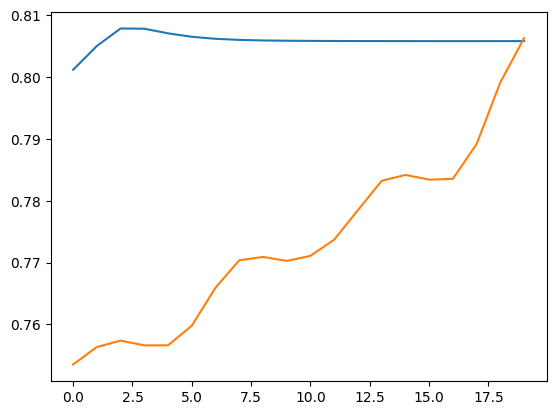

In [25]:
plt.plot(trainPredict[1,:,0])
plt.plot(gen_x[1,:,0])

In [32]:
print (np.shape(scaled_test))

last_train_batch = scaled_train[-n_input:]

last_train_batch = last_train_batch.reshape((1, n_input,n_features))

(922, 1)


In [31]:
model.predict(last_train_batch)

1/1 [==============================] - 0s 34ms/step


array([[[0.42152762],
        [0.41806647],
        [0.41363007],
        [0.4102201 ],
        [0.4077409 ],
        [0.40595385],
        [0.40475178],
        [0.40400055],
        [0.40354025],
        [0.4032596 ],
        [0.4030918 ],
        [0.4029954 ],
        [0.40294456],
        [0.40291536],
        [0.40290183],
        [0.40289903],
        [0.402903  ],
        [0.4029107 ],
        [0.40292007],
        [0.40292978]]], dtype=float32)

In [40]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(2172):

    current_pred = model.predict(current_batch)[0]

    test_predictions.append(current_pred)
    print (test_predictions)
    current_batch = np.append(current_batch[:,1:,:], [current_pred], axis =1)
    

1/1 [==============================] - 0s 24ms/step
[array([[0.42152762],
       [0.41806647],
       [0.41363007],
       [0.4102201 ],
       [0.4077409 ],
       [0.40595385],
       [0.40475178],
       [0.40400055],
       [0.40354025],
       [0.4032596 ],
       [0.4030918 ],
       [0.4029954 ],
       [0.40294456],
       [0.40291536],
       [0.40290183],
       [0.40289903],
       [0.402903  ],
       [0.4029107 ],
       [0.40292007],
       [0.40292978]], dtype=float32)]
1/1 [==============================] - 0s 232ms/step
[array([[0.42152762],
       [0.41806647],
       [0.41363007],
       [0.4102201 ],
       [0.4077409 ],
       [0.40595385],
       [0.40475178],
       [0.40400055],
       [0.40354025],
       [0.4032596 ],
       [0.4030918 ],
       [0.4029954 ],
       [0.40294456],
       [0.40291536],
       [0.40290183],
       [0.40289903],
       [0.402903  ],
       [0.4029107 ],
       [0.40292007],
       [0.40292978]], dtype=float32), array([[0.40900725]

KeyboardInterrupt: 

In [79]:
scaled_test[0]

array([0.36305683])

In [55]:
scaler = MinMaxScaler()
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

array([[0.75029215],
       [0.7535117 ],
       [0.75633945],
       ...,
       [0.34959843],
       [0.35628448],
       [0.36043517]])

In [6]:

no_ts_train = 0 #No. of timeseries data for training set
no_ts_test = 5 #No. of timeseries data for testing set
time_steps = 2172 #2172 is full size
from_sat_id = 150
to_sat_id = from_sat_id + no_ts_train 
# Create an array to store the training data. 
train_data = np.empty([no_ts_train,time_steps,1])

# Load the satellite feature from csv to array.
for i, file_path in enumerate(datalist[from_sat_id:to_sat_id]):
    df = pd.read_csv(file_path)
    train_pd_data = df[:time_steps]['Inclination (deg)'].values.reshape(-1,1)
    train_data[i,:,:] = train_pd_data

test_data = np.empty([no_ts_test,time_steps,1])


#for j, file_path in enumerate(datalist[25:30]):
#    df = pd.read_csv(file_path)
#    train_pd_data = df[:time_steps]['Inclination (deg)'].values.reshape(-1,1)
#    test_data[j,:,:] = train_pd_data

#print (train_data[0,:,:])


In [14]:
print (train_data[0,:,:])
#results = seasonal_decompose(df[:2172]['Inclination (deg)'])
#results.plot();
#n_input = 200
#n_features = 1
#generator = TimeseriesGenerator(train_data[0,:,:], train_data[0,:,:], length=n_input, batch_size=1)
#XX,yy = generator[0]
#print (XX.flatten())
#print (yy.flatten())

[[0.13982156]
 [0.14000827]
 [0.14013898]
 ...
 [0.14414284]
 [0.14418367]
 [0.14423022]]


In [15]:
#flattened_train_data = train_data.reshape(-1, 1)
#flattened_test_data = test_data.reshape(-1, 1)

#scaler = StandardScaler()
scaler = MinMaxScaler(feature_range=(0,1))
normalized_train_data = scaler.fit_transform(flattened_train_data)
#normalized_train_data = normalized_train_data.reshape(train_data.shape)

#normalized_test_data = scaler.fit_transform(flattened_test_data)
#normalized_test_data = normalized_test_data.reshape(test_data.shape)

normalized_train_data = train_data
normalized_test_data = test_data

print (normalized_train_data)
#print (normalized_test_data)

[[[0.13982156]
  [0.14000827]
  [0.14013898]
  ...
  [0.14414284]
  [0.14418367]
  [0.14423022]]

 [[0.07680198]
  [0.07704575]
  [0.07729327]
  ...
  [0.06900779]
  [0.06924434]
  [0.06927987]]

 [[0.0965601 ]
  [0.09653036]
  [0.09648561]
  ...
  [0.56432082]
  [0.56473577]
  [0.56537386]]]


In [16]:
model = Sequential()
model.add(LSTM(128, activation='relu', input_shape=(time_steps, 3), return_sequences=True))
model.add(LSTM(64, activation='relu', return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=True))
model.add(LSTM(16, activation='relu', return_sequences=False))  # The last LSTM layer, return_sequences=False
model.add(RepeatVector(time_steps))
model.add(LSTM(16, activation='relu', return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=True))
model.add(LSTM(64, activation='relu', return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(TimeDistributed(Dense(1)))

In [17]:
num_epochs = 10
batch_size = 32
validation_split = 0.1

In [18]:
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(train_data, train_data, epochs=num_epochs, batch_size=batch_size)

Epoch 1/10


ValueError: in user code:

    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 1150, in train_step
        y_pred = self(x, training=True)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Exception encountered when calling layer 'sequential_1' (type Sequential).
    
    Input 0 of layer "lstm_8" is incompatible with the layer: expected shape=(None, None, 3), found shape=(None, 2172, 1)
    
    Call arguments received by layer 'sequential_1' (type Sequential):
      • inputs=tf.Tensor(shape=(None, 2172, 1), dtype=float32)
      • training=True
      • mask=None


In [286]:
model.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_51 (LSTM)              (None, 200, 128)          66560     
                                                                 
 lstm_52 (LSTM)              (None, 200, 64)           49408     
                                                                 
 lstm_53 (LSTM)              (None, 200, 32)           12416     
                                                                 
 lstm_54 (LSTM)              (None, 16)                3136      
                                                                 
 repeat_vector_16 (RepeatVe  (None, 400, 16)           0         
 ctor)                                                           
                                                                 
 lstm_55 (LSTM)              (None, 400, 16)           2112      
                                                     

In [287]:
reconstructed_train = model.predict(normalized_train_data)
reconstructed_test = model.predict(normalized_test_data)

# Inverse transform the reconstructed sequences to the original scale
#reconstructed_train_original_scale = scaler.inverse_transform(reconstructed_train.reshape(-1, 1)).reshape(train_data.shape)
#reconstructed_test_original_scale = scaler.inverse_transform(reconstructed_test.reshape(-1, 1)).reshape(test_data.shape)

ValueError: in user code:

    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 2440, in predict_function  *
        return step_function(self, iterator)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 2425, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 2413, in run_step  **
        outputs = model.predict_step(data)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py", line 2381, in predict_step
        return self(x, training=False)
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\Users\raman\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential_17" is incompatible with the layer: expected shape=(None, 200, 1), found shape=(None, 400, 1)


In [242]:
mse_train = np.mean(np.square(normalized_train_data - reconstructed_train), axis=(1, 2))
mse_test = np.mean(np.square(normalized_test_data - reconstructed_test), axis=(1, 2))

[0.00062307 0.00348667 0.05090687]
[0.00464378 0.00467982 0.08028999 0.07996237 0.07971716]


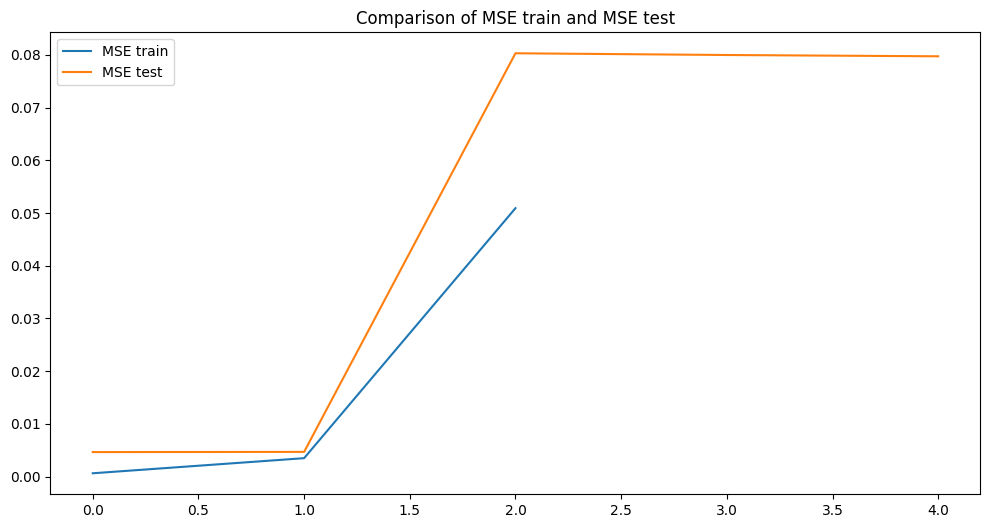

In [243]:
print (mse_train)
print (mse_test)
plt.figure(figsize=(12, 6))
plt.plot(mse_train, label='MSE train')
plt.plot(mse_test, label='MSE test')
plt.title('Comparison of MSE train and MSE test')
plt.legend()
plt.show()

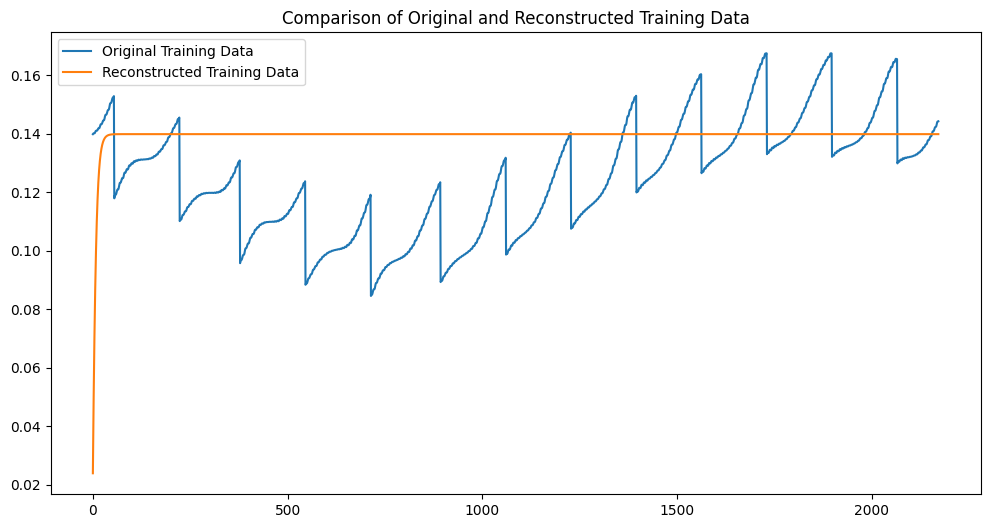

In [244]:
# Plotting training data and reconstructed training data
plt.figure(figsize=(12, 6))
plt.plot(train_data[0, :,0], label='Original Training Data')
plt.plot(reconstructed_train[0, :, 0], label='Reconstructed Training Data')
plt.title('Comparison of Original and Reconstructed Training Data')
plt.legend()
plt.show()

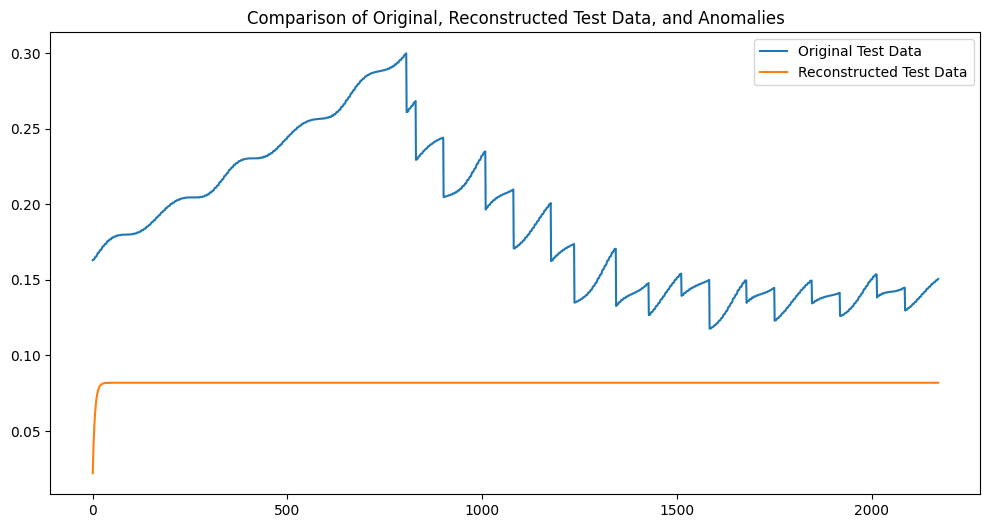

In [207]:
# Plotting test data, reconstructed test data, and anomalies
plt.figure(figsize=(12, 6))
plt.plot(normalized_test_data[0, :, 0], label='Original Test Data')
plt.plot(reconstructed_test[0, :, 0], label='Reconstructed Test Data')
#plt.scatter(np.where(mse_test > threshold)[0], test_data[0, mse_test > threshold, 0], color='red', label='Anomalies')
plt.title('Comparison of Original, Reconstructed Test Data, and Anomalies')
plt.legend()
plt.show()

In [ ]:
dataframe = pd.read_csv('data/GE.csv')
df = dataframe[['Date', 'Close']]
df['Date'] = pd.to_datetime(df['Date'])

sns.lineplot(x=df['Date'], y=df['Close'])

print("Start date is: ", df['Date'].min())
print("End date is: ", df['Date'].max())

#Change train data from Mid 2017 to 2019.... seems to be a jump early 2017
train, test = df.loc[df['Date'] <= '2003-12-31'], df.loc[df['Date'] > '2003-12-31']


#Convert pandas dataframe to numpy array
#dataset = dataframe.values
#dataset = dataset.astype('float32') #COnvert values to float

#LSTM uses sigmoid and tanh that are sensitive to magnitude so values need to be normalized
# normalize the dataset
#scaler = MinMaxScaler() #Also try QuantileTransformer
scaler = StandardScaler()
scaler = scaler.fit(train[['Close']])

train['Close'] = scaler.transform(train[['Close']])
test['Close'] = scaler.transform(test[['Close']])


#As required for LSTM networks, we require to reshape an input data into n_samples x timesteps x n_features. 
#In this example, the n_features is 2. We will make timesteps = 3. 
#With this, the resultant n_samples is 5 (as the input data has 9 rows).

seq_size = 30  # Number of time steps to look back 
#Larger sequences (look further back) may improve forecasting.


def to_sequences(x, y, seq_size=1):
    x_values = []
    y_values = []

    for i in range(len(x)-seq_size):
        #print(i)
        x_values.append(x.iloc[i:(i+seq_size)].values)
        y_values.append(y.iloc[i+seq_size])
        
    return np.array(x_values), np.array(y_values)

trainX, trainY = to_sequences(train[['Close']], train['Close'], seq_size)
testX, testY = to_sequences(test[['Close']], test['Close'], seq_size)


# define Autoencoder model
#Input shape would be seq_size, 1 - 1 beacuse we have 1 feature. 
# seq_size = trainX.shape[1]

# model = Sequential()
# model.add(LSTM(128, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2]), return_sequences=True))
# model.add(LSTM(64, activation='relu', return_sequences=False))
# model.add(RepeatVector(trainX.shape[1]))
# model.add(LSTM(64, activation='relu', return_sequences=True))
# model.add(LSTM(128, activation='relu', return_sequences=True))
# model.add(TimeDistributed(Dense(trainX.shape[2])))

# model.compile(optimizer='adam', loss='mse')
# model.summary()

#Try another model
model = Sequential()
model.add(LSTM(128, input_shape=(trainX.shape[1], trainX.shape[2])))
model.add(Dropout(rate=0.2))

model.add(RepeatVector(trainX.shape[1]))

model.add(LSTM(128, return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(trainX.shape[2])))
model.compile(optimizer='adam', loss='mae')
model.summary()

# fit model
history = model.fit(trainX, trainY, epochs=10, batch_size=32, validation_split=0.1, verbose=1)

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

#model.evaluate(testX, testY)

###########################
#Anomaly is where reconstruction error is large.
#We can define this value beyond which we call anomaly.
#Let us look at MAE in training prediction

trainPredict = model.predict(trainX)
trainMAE = np.mean(np.abs(trainPredict - trainX), axis=1)
plt.hist(trainMAE, bins=30)
max_trainMAE = 0.3  #or Define 90% value of max as threshold.

testPredict = model.predict(testX)
testMAE = np.mean(np.abs(testPredict - testX), axis=1)
plt.hist(testMAE, bins=30)

#Capture all details in a DataFrame for easy plotting
anomaly_df = pd.DataFrame(test[seq_size:])
anomaly_df['testMAE'] = testMAE
anomaly_df['max_trainMAE'] = max_trainMAE
anomaly_df['anomaly'] = anomaly_df['testMAE'] > anomaly_df['max_trainMAE']
anomaly_df['Close'] = test[seq_size:]['Close']

#Plot testMAE vs max_trainMAE
sns.lineplot(x=anomaly_df['Date'], y=anomaly_df['testMAE'])
sns.lineplot(x=anomaly_df['Date'], y=anomaly_df['max_trainMAE'])

anomalies = anomaly_df.loc[anomaly_df['anomaly'] == True]

#Plot anomalies
sns.lineplot(x=anomaly_df['Date'], y=scaler.inverse_transform(anomaly_df['Close']))
sns.scatterplot(x=anomalies['Date'], y=scaler.inverse_transform(anomalies['Close']), color='r')
